# Clustering mengenai Mental Health (Anxiety, Depression, Stress)

Proyek ini bertujuan untuk menganalisis data dari OSMI Mental Health in Tech Survey 2016 guna memahami kondisi kesehatan mental di kalangan pekerja teknologi. Dengan lebih dari 1400 responden, data ini mencerminkan pandangan, pengalaman, dan tantangan yang dihadapi oleh para profesional IT terkait kecemasan, depresi, stres, serta akses terhadap dukungan psikologis di tempat kerja.

Dalam proyek ini, saya menerapkan teknik clustering untuk mengelompokkan responden berdasarkan pola jawaban yang serupa—seperti tingkat stres, kenyamanan membicarakan kesehatan mental, dan dukungan dari perusahaan. Selain itu, saya juga menggunakan metode klasifikasi untuk memprediksi kemungkinan seseorang mengalami gangguan mental tertentu berdasarkan atribut-atribut yang tersedia.

# **1. Perkenalan Dataset**


Berikut adalah informasi mengenai dataset yang digunakan

1. **Sumber Dataset**:  
   Dataset dapat diakses melalui kaggle, dengan link berikut ini:
   - ini untuk menganalisis dari segi tech background https://www.kaggle.com/datasets/osmi/mental-health-in-tech-2016


2. **Deskripsi Dataset**:  
   Dataset ini berisi informasi mengenai data tentang prevalensi  terhadap kesehatan mental di antara pekerja teknologi.

# **2. Import Library**

Import library yang digunakan dalam proses analisis dan prediksi machine learning nya

In [45]:
#Type your code here
import pandas as pd
from yellowbrick.cluster import KElbowVisualizer
from collections import Counter
from functools import reduce
import requests
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.cluster import KMeans, DBSCAN  # Mengimpor algoritma KMeans dan DBSCAN untuk clustering
from sklearn.metrics import silhouette_score  # Mengimpor silhouette_score untuk mengevaluasi hasil clustering
from sklearn.decomposition import PCA

# **3. Memuat Dataset**

Pada tahap ini, langkah pertama adalah menentukan path dari file ZIP yang berisi dataset CSV dengan mendefinisikan variabel `zip_path`. Setelah itu, file ZIP dibuka menggunakan `ZipFile` dengan mode 'r' (read) untuk membaca isinya. Dengan menggunakan fungsi `namelist()`, daftar nama file yang ada di dalam ZIP diperoleh dan disimpan dalam variabel `list_file`. Kemudian, sebuah dictionary `data_frames1` dan `data_frames2`dibuat untuk menyimpan dataframe dari setiap file CSV yang ada di dalam ZIP. Proses selanjutnya adalah melakukan iterasi pada setiap file yang ada di dalam ZIP, di mana setiap file dibuka menggunakan `z.open(file)`. Setelah file CSV terbuka, fungsi `pd.read_csv(f)` digunakan untuk membaca data dari file tersebut dan mengubahnya menjadi dataframe. Dataframe tersebut disimpan dalam dictionary `data_frames1` dan `data_frames2` dengan nama file sebagai key. Setiap kali file berhasil dibaca, program mencetak pesan yang memberi tahu bahwa data dari file tersebut telah berhasil dimuat. Dengan demikian, kode ini berfungsi untuk mengekstrak dan membaca semua file CSV dalam sebuah ZIP dan menyimpannya dalam bentuk dataframe untuk analisis lebih lanjut.

In [46]:
# membaca data set dengan bantuan library pandas
df = pd.read_csv('/content/Dataset_inisiasi.csv')
df.head()

,Are you self-employed?,How many employees does your company or organization have?,Is your employer primarily a tech company/organization?,Is your primary role within your company related to tech/IT?,Does your employer provide mental health benefits as part of healthcare coverage?,Do you know the options for mental health care available under your employer-provided coverage?,"Has your employer ever formally discussed mental health (for example, as part of a wellness campaign or other official communication)?",Does your employer offer resources to learn more about mental health concerns and options for seeking help?,Is your anonymity protected if you choose to take advantage of mental health or substance abuse treatment resources provided by your employer?,"If a mental health issue prompted you to request a medical leave from work, asking for that leave would be:",...,"If you have a mental health issue, do you feel that it interferes with your work when being treated effectively?","If you have a mental health issue, do you feel that it interferes with your work when NOT being treated effectively?",What is your age?,What is your gender?,What country do you live in?,What US state or territory do you live in?,What country do you work in?,What US state or territory do you work in?,Which of the following best describes your work position?,Do you work remotely?
0,0,26-100,1.0,NaN,Not eligible for coverage / N/A,NaN,No,No,I don't know,Very easy,...,Not applicable to me,Not applicable to me,39,Male,United Kingdom,NaN,United Kingdom,NaN,Back-end Developer,Sometimes
1,0,6-25,1.0,NaN,No,Yes,Yes,Yes,Yes,Somewhat easy,...,Rarely,Sometimes,29,male,United States of America,Illinois,United States of America,Illinois,Back-end Developer|Front-end Developer,Never
2,0,6-25,1.0,NaN,No,NaN,No,No,I don't know,Neither easy nor difficult,...,Not applicable to me,Not applicable to me,38,Male,United Kingdom,NaN,United Kingdom,NaN,Back-end Developer,Always
3,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,Sometimes,Sometimes,43,male,United Kingdom,NaN,United Kingdom,NaN,Supervisor/Team Lead,Sometimes
4,0,6-25,0.0,1.0,Yes,Yes,No,No,No,Neither easy nor difficult,...,Sometimes,Sometimes,43,Female,United States of America,Illinois,United States of America,Illinois,Executive Leadership|Supervisor/Team Lead|Dev ...,Sometimes


# **4. Exploratory Data Analysis (EDA)**

Pada tahap ini, akan melakukan **Exploratory Data Analysis (EDA)** untuk memahami karakteristik dataset. EDA bertujuan untuk:

1. **Memahami Struktur Data**
   - Tinjau jumlah baris dan kolom dalam dataset.  
   - Tinjau jenis data di setiap kolom (numerikal atau kategorikal).

2. **Menangani Data yang Hilang**  
   - Identifikasi dan analisis data yang hilang (*missing values*). Tentukan langkah-langkah yang diperlukan untuk menangani data yang hilang, seperti pengisian atau penghapusan data tersebut.

3. **Analisis Distribusi dan Korelasi**  
   - Analisis distribusi variabel numerik dengan statistik deskriptif dan visualisasi seperti histogram atau boxplot.  
   - Periksa hubungan antara variabel menggunakan matriks korelasi atau scatter plot.

4. **Visualisasi Data**  
   - Buat visualisasi dasar seperti grafik distribusi dan diagram batang untuk variabel kategorikal.  
   - Gunakan heatmap atau pairplot untuk menganalisis korelasi antar variabel.

Tujuan dari EDA adalah untuk memperoleh wawasan awal yang mendalam mengenai data dan menentukan langkah selanjutnya dalam analisis atau pemodelan.

## 4.1. Memahami struktur data

In [47]:
# Cek jumlah baris dan kolom
print(f"Jumlah Baris: {df.shape[0]}, Jumlah Kolom: {df.shape[1]}")

Jumlah Baris: 1433, Jumlah Kolom: 63


In [48]:
# cek tipe data di tiap kolom nya
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1433 entries, 0 to 1432
Data columns (total 63 columns):
 #   Column                                                                                                                                                                            Non-Null Count  Dtype  
---  ------                                                                                                                                                                            --------------  -----  
 0   Are you self-employed?                                                                                                                                                            1433 non-null   int64  
 1   How many employees does your company or organization have?                                                                                                                        1146 non-null   object 
 2   Is your employer primarily a tech company/organization?     

Data ini terdapat 1433 baris, 63 columns. Data bertipe float sebanyak 3, integer sebanyak 4, dan object/string sebanyak 56.

## 4.2. Menangani Data yang Hilang

Mengecek jumlah data yang hilang ditiap kolom dengan menggunakan method sum() dan method sort_values parameternya ascending False agar mengetahui jumlah missing value dari yang paling banyak

In [49]:
df.isnull().sum().sort_values(ascending=False)

,0
"If you have revealed a mental health issue to a client or business contact, do you believe this has impacted you negatively?",1289
"If yes, what percentage of your work time (time performing primary or secondary job functions) is affected by a mental health issue?",1229
Is your primary role within your company related to tech/IT?,1170
Do you have medical coverage (private insurance or state-provided) which includes treatment of mental health issues?,1146
"If you have been diagnosed or treated for a mental health disorder, do you ever reveal this to clients or business contacts?",1146
...,...
What is your age?,0
What country do you live in?,0
What country do you work in?,0
Which of the following best describes your work position?,0


Terdapat banyak missing value terutama di 5 kolom pada file

In [50]:
# Persentase null agar bisa memutuskan hal yang dilakukan setelahnya
for col in df.columns:
  null_percentage = (df[col].isnull().sum() / len(df)) * 100
  if null_percentage > 0:
    print(f"{col}: {null_percentage:.2f}%")

How many employees does your company or organization have?: 20.03%
Is your employer primarily a tech company/organization?: 20.03%
Is your primary role within your company related to tech/IT?: 81.65%
Does your employer provide mental health benefits as part of healthcare coverage?: 20.03%
Do you know the options for mental health care available under your employer-provided coverage?: 29.31%
Has your employer ever formally discussed mental health (for example, as part of a wellness campaign or other official communication)?: 20.03%
Does your employer offer resources to learn more about mental health concerns and options for seeking help?: 20.03%
Is your anonymity protected if you choose to take advantage of mental health or substance abuse treatment resources provided by your employer?: 20.03%
If a mental health issue prompted you to request a medical leave from work, asking for that leave would be:: 20.03%
Do you think that discussing a mental health disorder with your employer would h

In [51]:
# hapus missing value yg >50% pada data frame 1 yang isinya data mental-heath-in-tech-2016_20161114.csv
threshold = 50
columns_to_drop = [] # array untuk nyimpen data kolom yg didrop, tujuannya agar tau mana aja yang udah didrop
df = df.dropna(thresh=len(df) * (1 - threshold / 100), axis=1)

# Karena ini pertanyaan terkait mental health, mungkin user gamau jawab aja jadi replace dengan "Unknown"
# Karena misal di replace sama modulus jadinya agak aneh misal ya gender, nah kalo modulusnya cewe terus user yg gamau jawab ternyata cowo gmn kan jadi missing information jadi ya menurut ku ini aja si ganti ke Unknown

for col in df.select_dtypes(include=['object']).columns:
    df[col] = df[col].fillna('Unknown')

# ini saya pilih fillna dengan median agar resistensi terhadap outlier
for col in df.select_dtypes(include=['int64', 'float64']).columns:
    df[col] = df[col].fillna(df[col].median())

# Cek null yang udah melewati cleaning missing value
print(df.isnull().sum())


Are you self-employed?                                                                                                                            0
How many employees does your company or organization have?                                                                                        0
Is your employer primarily a tech company/organization?                                                                                           0
Does your employer provide mental health benefits as part of healthcare coverage?                                                                 0
Do you know the options for mental health care available under your employer-provided coverage?                                                   0
Has your employer ever formally discussed mental health (for example, as part of a wellness campaign or other official communication)?            0
Does your employer offer resources to learn more about mental health concerns and options for seeking help?     

## 4.3. Analisis Distribusi dan Korelasi

In [52]:
# Cek statistik deskriptif untuk data numerik
print("\nStatistik Deskriptif:")
df.describe()


Statistik Deskriptif:


,Are you self-employed?,Is your employer primarily a tech company/organization?,Do you have previous employers?,Have you ever sought treatment for a mental health issue from a mental health professional?,What is your age?
count,1433.000000,1433.000000,1433.000000,1433.000000,1433.000000
mean,0.200279,0.816469,0.882066,0.585485,34.286113
std,0.400349,0.387236,0.322643,0.492810,11.290931
min,0.000000,0.000000,0.000000,0.000000,3.000000
25%,0.000000,1.000000,1.000000,0.000000,28.000000
50%,0.000000,1.000000,1.000000,1.000000,33.000000
75%,0.000000,1.000000,1.000000,1.000000,39.000000
max,1.000000,1.000000,1.000000,1.000000,323.000000


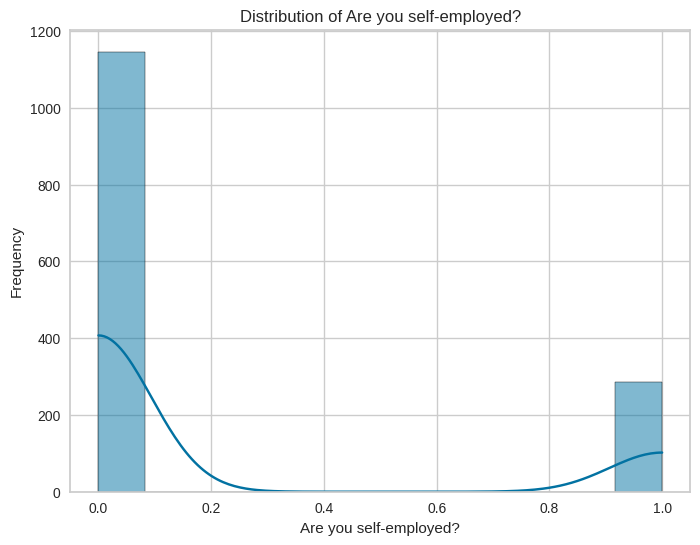

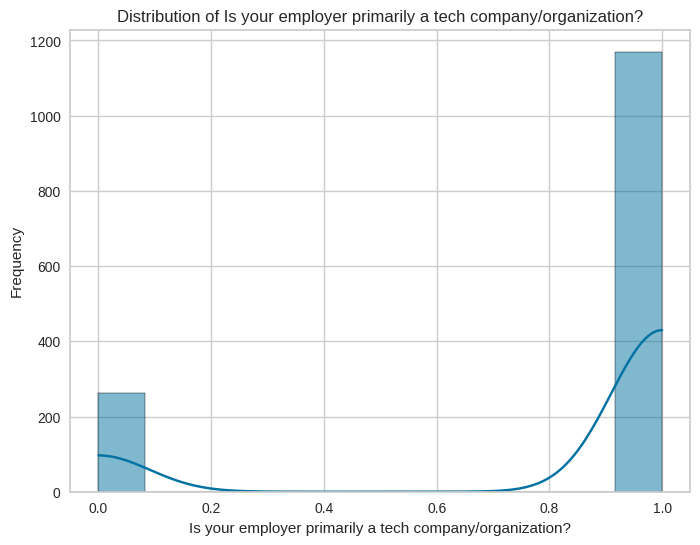

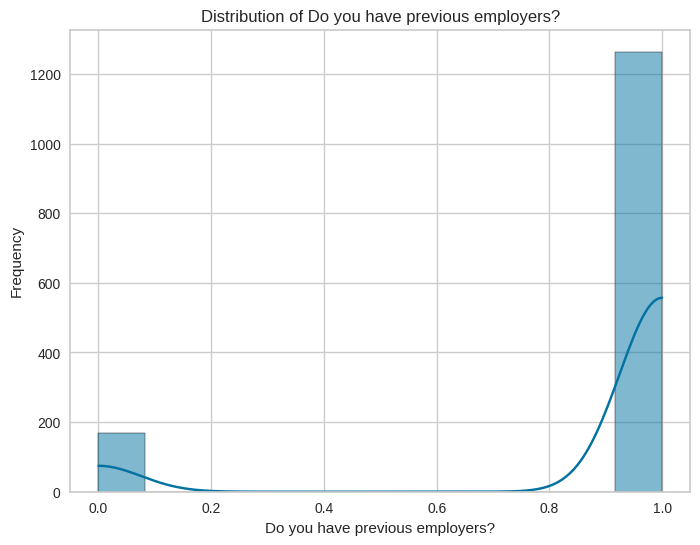

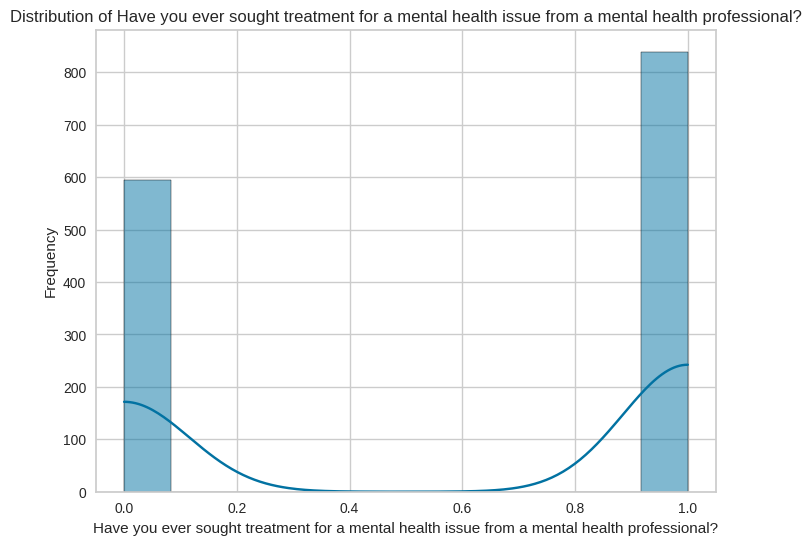

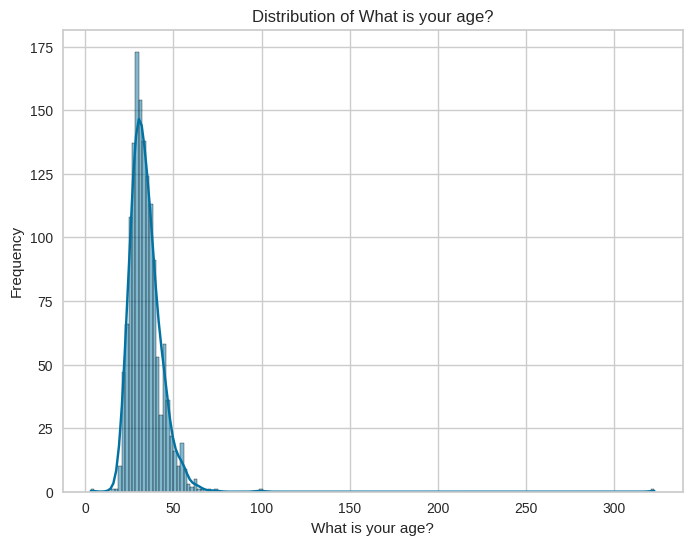

In [53]:
# Distribusi numerical col
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns

# menggunakan histplot() untuk membuat histogram agar terlihat distribusi frekuensi dari data frame 1
for col in numerical_cols:
    plt.figure(figsize=(8, 6))
    sns.histplot(df[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()



<ipython-input-54-3fb7a4f86914>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(15, 8))


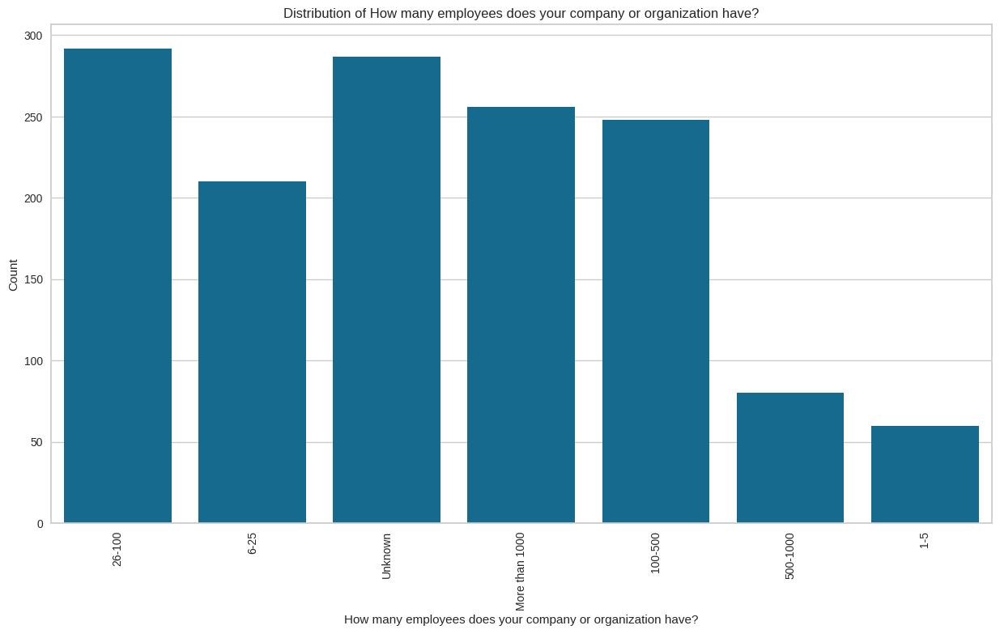

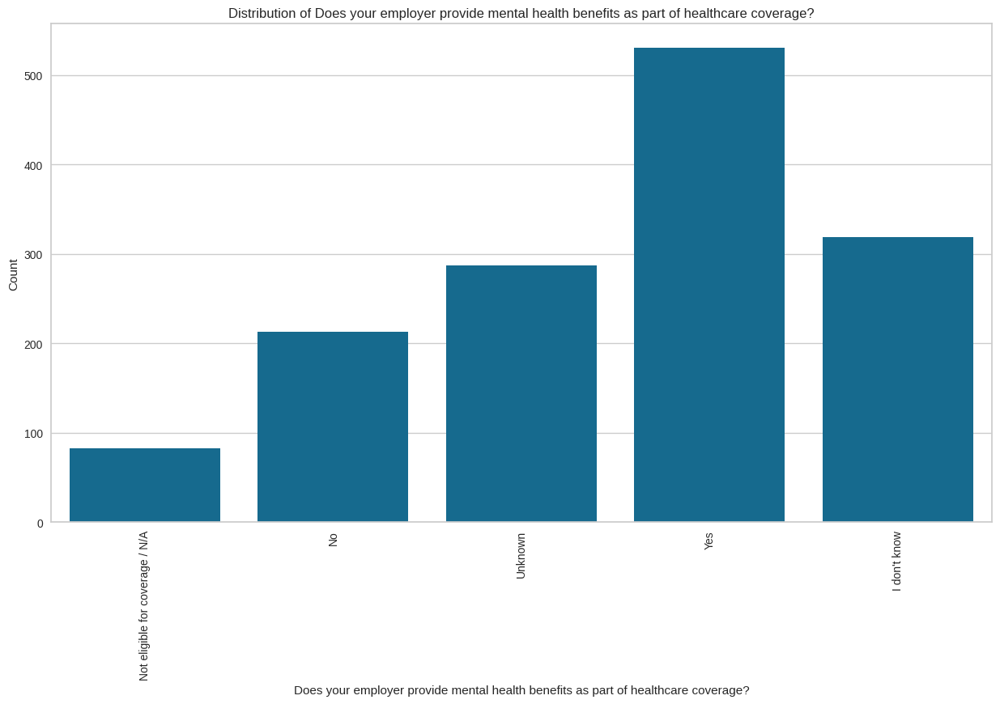

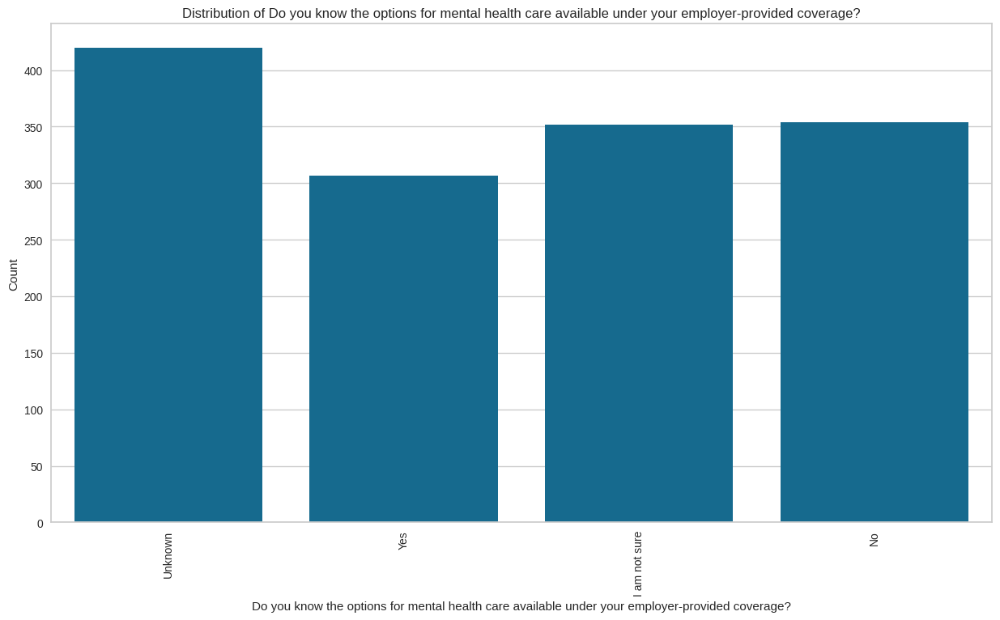

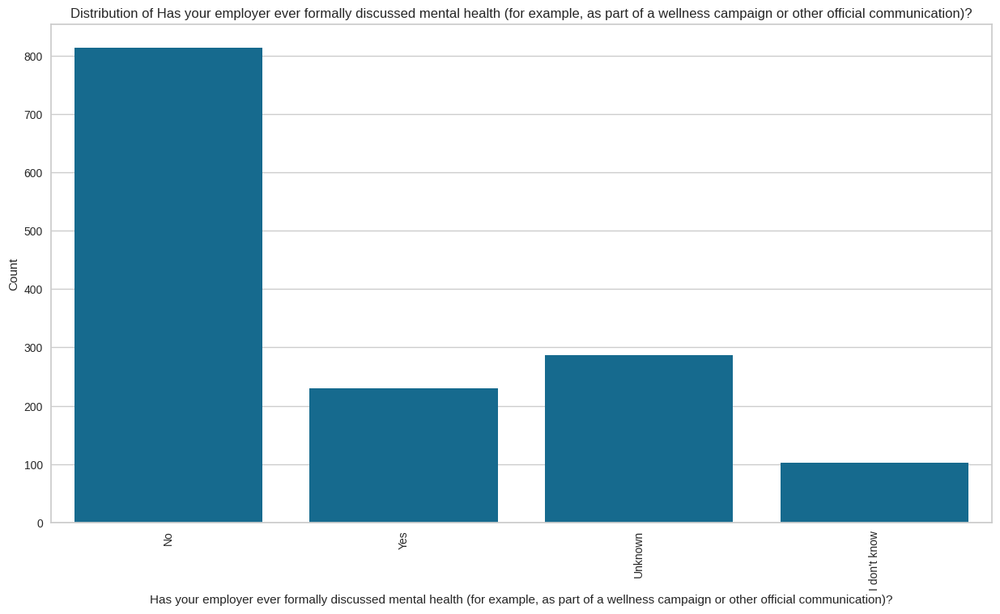

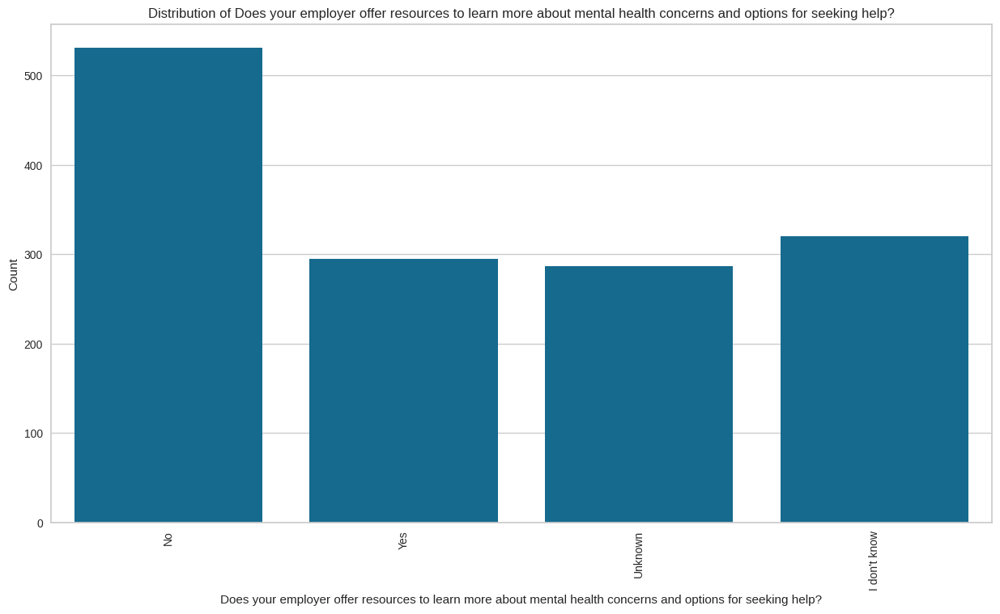

...

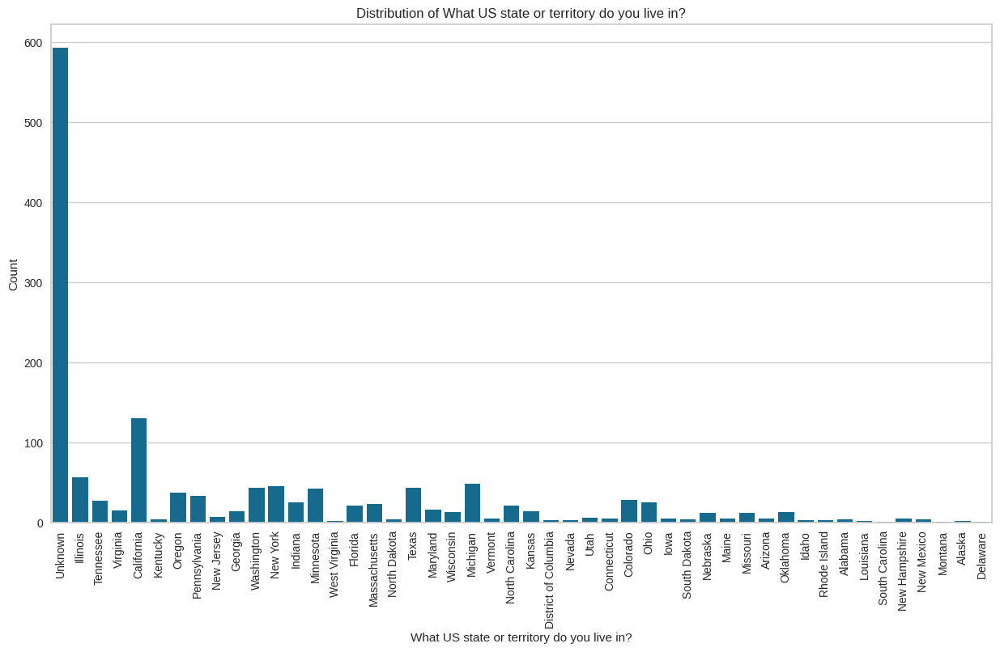

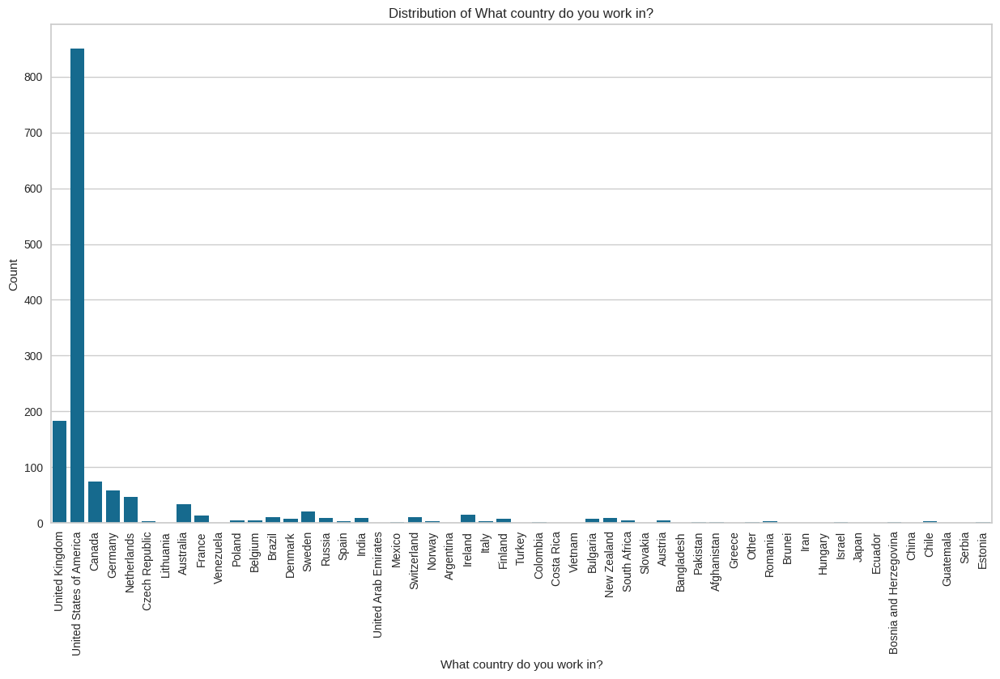

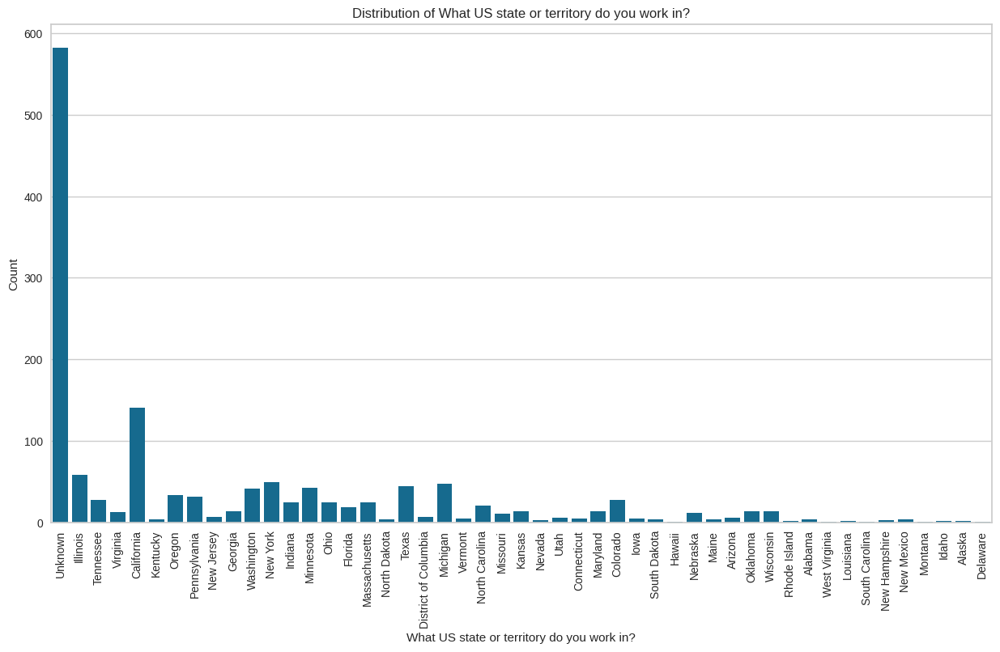

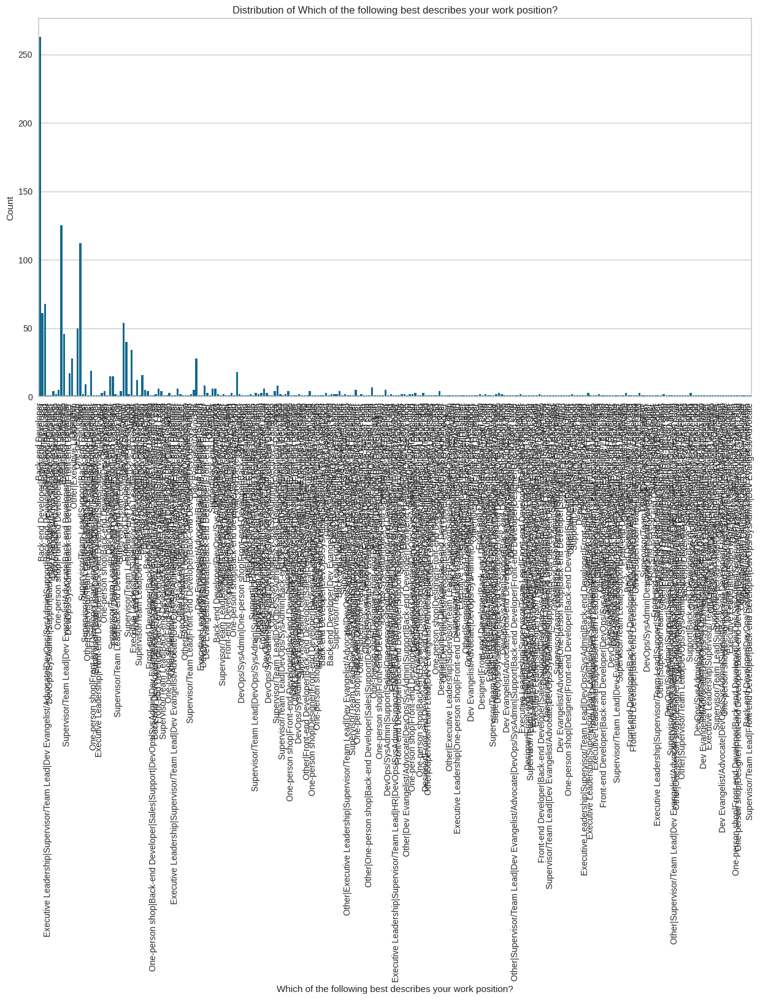

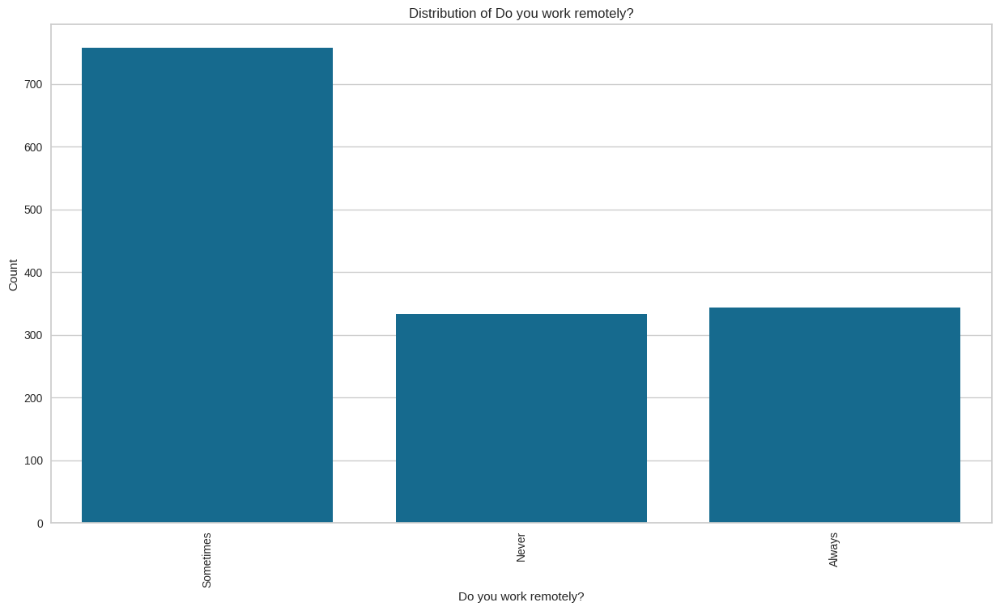

In [54]:
# Distrtibusi untuk kolom kategori
categorical_cols = df.select_dtypes(include=['object']).columns

for column in categorical_cols:
    plt.figure(figsize=(15, 8))
    plt.xticks(rotation=90, ha='center')
    sns.countplot(x=df[column])
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Count')
    plt

Dari distribusi categorical column dapat disimpulkan bahwa :
-	Banyak company yang sudah menyediakan health care di mental health kepada employee nya
-	Jumlah responden yang menjawab "Ya" dan "Tidak" hampir seimbang, masing-masing dengan sekitar 300-350 responden. Ini menunjukkan bahwa banyak karyawan yang tidak sepenuhnya mengetahui opsi yang tersedia terkait perawatan kesehatan mental dalam cakupan asuransi mereka.
-	Sebagian besar responden menjawab "Tidak" (lebih dari 800 orang), menunjukkan bahwa banyak perusahaan belum secara resmi membahas atau mengomunikasikan isu kesehatan mental di tempat kerja.
-	Sebagian besar responden (lebih dari 500 orang) menjawab "Tidak", yang menunjukkan bahwa banyak perusahaan belum menyediakan sumber daya atau informasi terkait kesehatan mental dan cara mencari bantuan.
-	Sebagian besar responden (lebih dari 200 orang) menjawab "Ya", yang menunjukkan bahwa banyak orang merasa produktivitas mereka dapat dipengaruhi oleh masalah kesehatan mental.


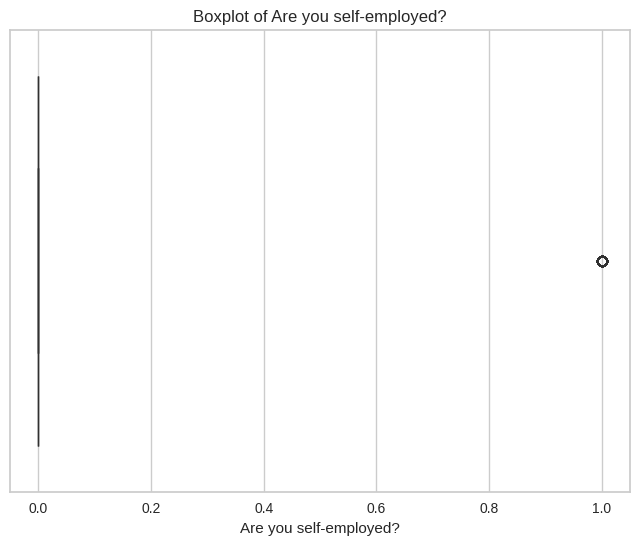

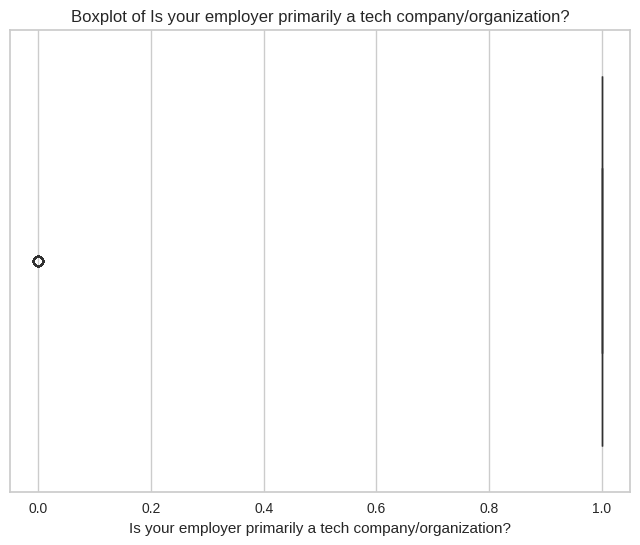

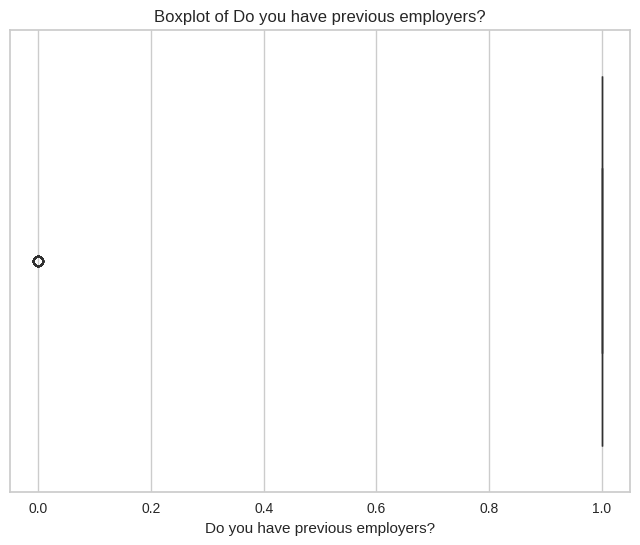

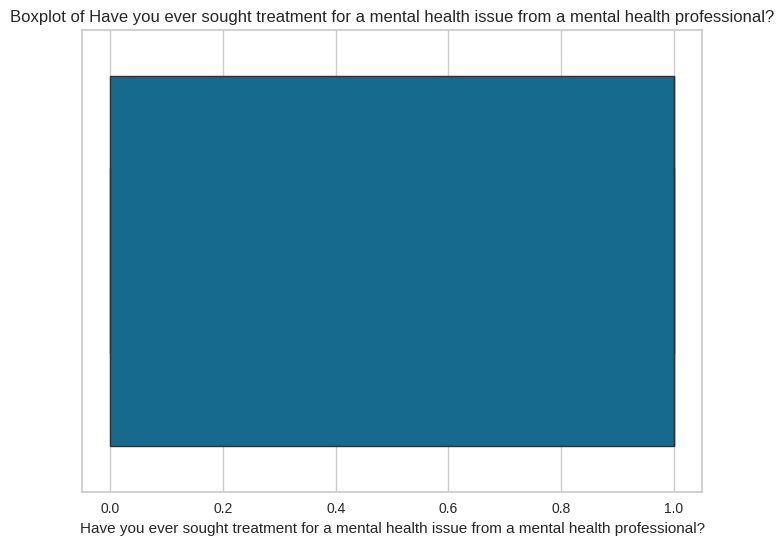

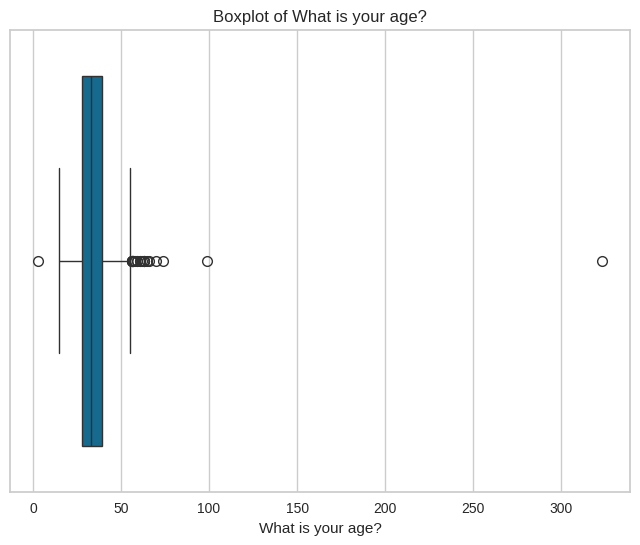

In [55]:
# Boxplot untuk fitur numerik
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns
for col in numerical_cols:
    plt.figure(figsize=(8, 6))
    sns.boxplot(x=df[col])
    plt.title(f'Boxplot of {col}')
    plt.xlabel(col)
    plt.show()



Distribusi diatas so far oke si tapi pas di bloxplot yang age itu ada outlier Dari boxplot tersebut, kita bisa melihat bahwa ada nilai yang jauh lebih besar dari usia normal (misalnya, ada nilai di atas 100 tahun, bahkan 300 tahun). Ini adalah contoh outlier, yang bisa disebabkan oleh kesalahan input data atau individu yang melaporkan usia yang tidak masuk akal.

bisa diliat di plot diatas user yang ngisi itu distribusi nya untuk yang data frame 1
- kebanyakan tidak self employee
- kebanyakan asalnya dari tech company
- kebanyakan company nya related ke tech
- kebanyakan memiliki jaminan kesehatan (asuransi swasta atau yang disediakan negara) yang mencakup perawatan untuk masalah kesehatan mental.
- kebanyakan pernah bekerja sebelumnya / ada pemberi kerja sebelumnya
- kebanyakan pernah mencari treatment untuk masalah kesehatan mental
- umurnya kebanyakan di 25 an


Dari bloxplot diatas dapat diketahui bahwa:
- terdapat outlier pada kolom 'Are you self-employed?',
- terdapat outlier pada kolom 'Is your employer primarily a tech company/organization?',
- terdapat outlier pada kolom 'Do you have previous employers?',
- tidak ada outlier pada kolom 'Have you ever sought treatment for a mental health issue from a mental health professional?',
- terdapat banyak outlier pada kolom 'What is your age?'

## 4.4. Visualisasi Data

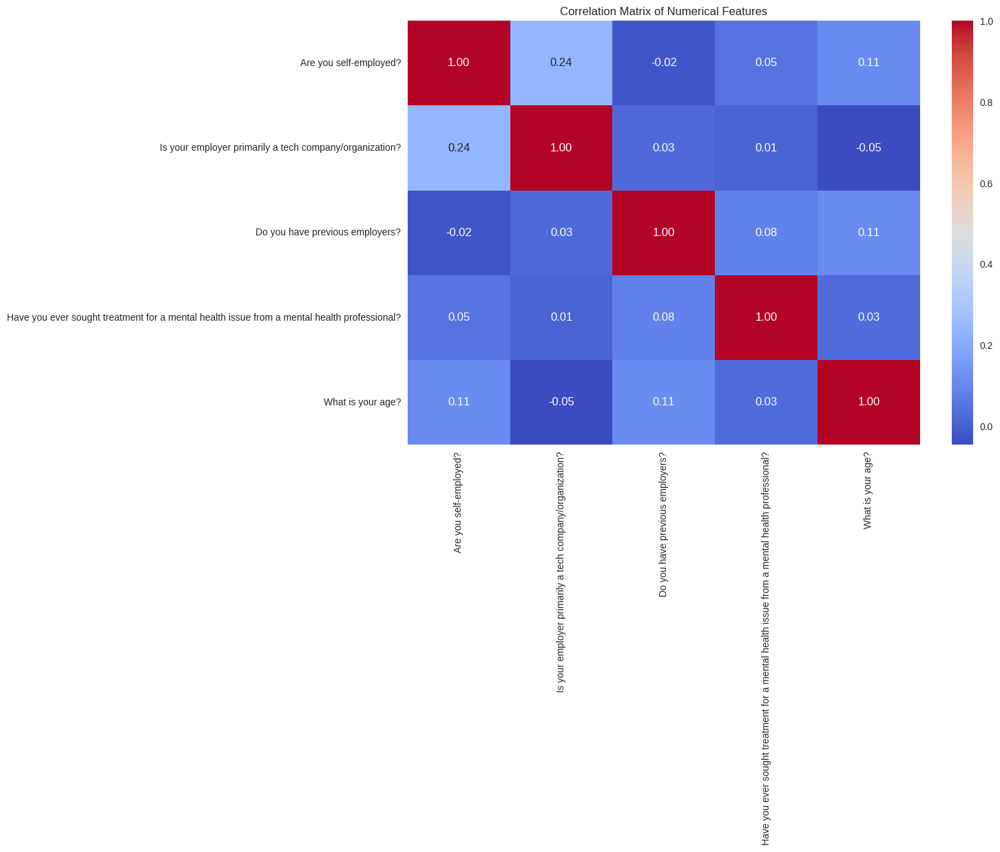

In [56]:
# 1. Calculate Pearson Correlation
numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns
correlation_matrix = df[numerical_columns].corr()

# 2. Plot Correlation Heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', cbar=True)
plt.title('Correlation Matrix of Numerical Features')
plt.show()


Grafik yang ditampilkan adalah matriks korelasi antara beberapa fitur numerik yang berkaitan dengan kondisi pekerja di industri teknologi, terutama yang terkait dengan kesehatan mental. Berikut adalah beberapa analisis singkat berdasarkan grafik tersebut:

1. **Korelasi antara "Are you self-employed?" dan "Is your employer primarily a tech company/organization?" (0.24)**:
   Terdapat korelasi positif yang rendah antara status kewirausahaan (self-employed) dengan apakah perusahaan tempat bekerja merupakan perusahaan teknologi. Ini menunjukkan bahwa sedikit pekerja wirausaha bekerja di perusahaan teknologi, meskipun ada sebagian kecil yang melakukannya.

2. **Korelasi antara "Do you have previous employers?" dan "Have you ever sought treatment for a mental health issue from a mental health professional?" (0.08)**:
   Korelasi ini sangat rendah, menunjukkan bahwa pengalaman memiliki pekerjaan sebelumnya tidak terlalu terkait dengan apakah seseorang mencari perawatan untuk masalah kesehatan mental.

3. **Korelasi antara "What is your age?" dan fitur lainnya (nilai sekitar 0.11 atau lebih rendah)**:
   Umumnya, tidak ada korelasi yang kuat antara usia dengan fitur lainnya seperti status pekerjaan atau riwayat perawatan kesehatan mental, yang menunjukkan bahwa usia tidak berperan besar dalam faktor-faktor tersebut dalam survei ini.

Secara keseluruhan, tidak ada korelasi yang sangat tinggi antara fitur-fitur ini, yang menunjukkan bahwa faktor-faktor yang ditinjau dalam survei ini (seperti status pekerjaan, riwayat perawatan kesehatan mental, dan usia) cenderung beroperasi secara independen satu sama lain dalam konteks dataset ini.

# **5. Data Preprocessing**

Pada tahap ini, data preprocessing adalah langkah penting untuk memastikan kualitas data sebelum digunakan dalam model machine learning. Data mentah sering kali mengandung nilai kosong, duplikasi, atau rentang nilai yang tidak konsisten, yang dapat memengaruhi kinerja model. Oleh karena itu, proses ini bertujuan untuk membersihkan dan mempersiapkan data agar analisis berjalan optimal.

Berikut adalah tahapan-tahapan yang bisa dilakukan, tetapi **tidak terbatas** pada:

1. Menghapus atau Menangani Data Kosong (Missing Values)
2. Menghapus Data Duplikat
3. Normalisasi atau Standarisasi Fitur
4. Deteksi dan Penanganan Outlier
5. Encoding Data Kategorikal


## 5.1. Menghapus atau Menangani Data Kosong (Missing Value)

In [57]:
df.isnull().sum()

,0
Are you self-employed?,0
How many employees does your company or organization have?,0
Is your employer primarily a tech company/organization?,0
Does your employer provide mental health benefits as part of healthcare coverage?,0
Do you know the options for mental health care available under your employer-provided coverage?,0
"Has your employer ever formally discussed mental health (for example, as part of a wellness campaign or other official communication)?",0
Does your employer offer resources to learn more about mental health concerns and options for seeking help?,0
Is your anonymity protected if you choose to take advantage of mental health or substance abuse treatment resources provided by your employer?,0
"If a mental health issue prompted you to request a medical leave from work, asking for that leave would be:",0
Do you think that discussing a mental health disorder with your employer would have negative consequences?,0


## 5.2. Menghapus Data Duplicate

In [58]:
print("\nJumlah Data Duplikat:", df.duplicated().sum())

df = df.drop_duplicates()

print("\nJumlah Data Duplikat Setelah Dihapus:", df.duplicated().sum())


Jumlah Data Duplikat: 0

Jumlah Data Duplikat Setelah Dihapus: 0


## 5.3 Normalisasi atau Standarisasi Fitur

In [59]:
# data frame 1

# df1 = df1_mv_cleaned
# Select numerical columns untuk normalization
# num_cols1 = df.select_dtypes(include=['int64', 'float64']).columns

# Normalisasi semua fitur numerik
# scaler = MinMaxScaler()
# df[num_cols1] = scaler.fit_transform(df[num_cols1])

# print("Kolom yang dinormalisasi:", num_cols1)
# df1


# data frame 2

# df2 = df2_mv_cleaned
# Select numerical columns untuk normalization
# num_cols2 = df.select_dtypes(include=['int64', 'float64']).columns

# # Normalisasi semua fitur numerik
# scaler = MinMaxScaler()
# df[num_cols] = scaler.fit_transform(df[num_cols])

# print("Kolom yang dinormalisasi:", num_cols)
# df


Pada tahap preprocessing, tidak dilakukan normalisasi maupun standarisasi data. Hal ini dilakukan karena proses tersebut terbukti mengurangi pola atau informasi penting yang terkandung dalam dataset. Berdasarkan percobaan yang saya lakukan (dengan membandingkan hasil menggunakan normalisasi, standarisasi, dan tanpa keduanya) diperoleh hasil yang paling optimal ketika data dibiarkan dalam skala aslinya (tidak di normalisasi atau standarisasi).

## 5.4. Deteksi dan Penanganan Outlier

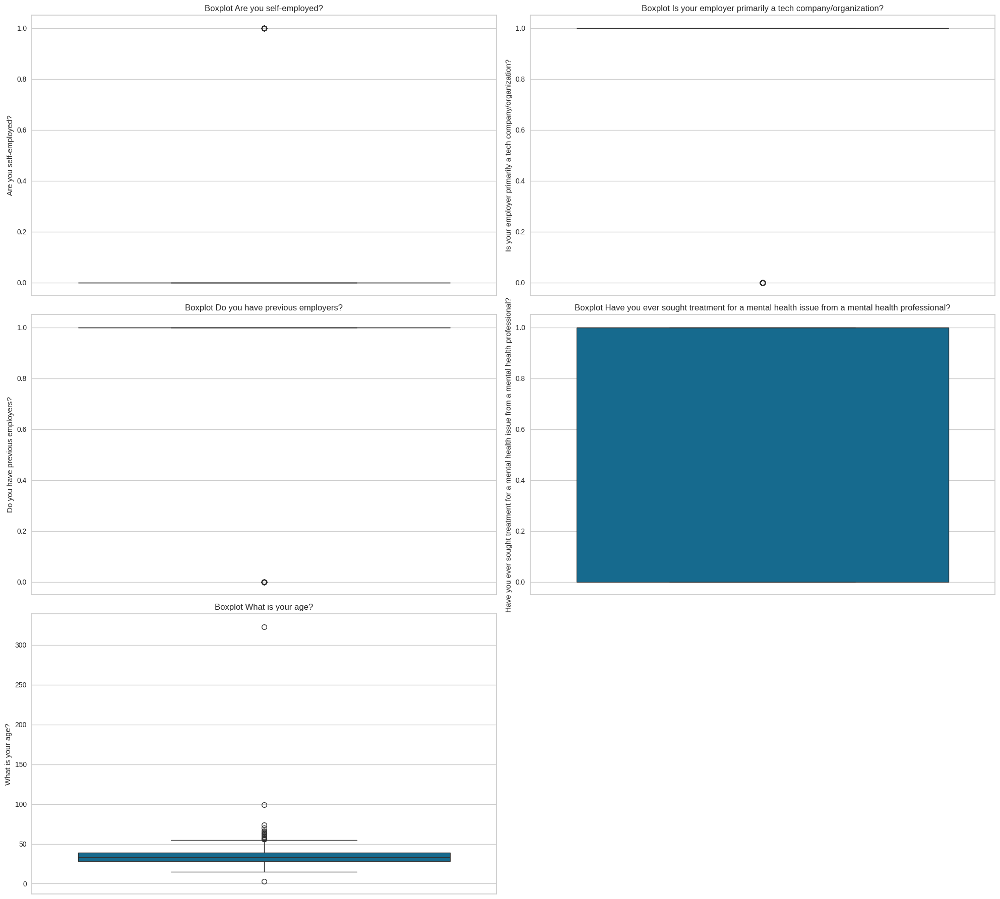

In [60]:
numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns
# Boxplot untuk fitur numerik
plt.figure(figsize=(20, 18))

for i, col in enumerate(numerical_columns, 1):
    plt.subplot(3, 2, i)
    sns.boxplot(data=df, y=col)
    plt.title(f"Boxplot {col}")

plt.tight_layout()
plt.show()

Dari bloxplot diatas dapat diketahui bahwa:
- terdapat outlier pada kolom 'Are you self-employed?',
- terdapat outlier pada kolom 'Is your employer primarily a tech company/organization?',
- terdapat outlier pada kolom 'Do you have previous employers?',
- tidak ada outlier pada kolom 'Have you ever sought treatment for a mental health issue from a mental health professional?',
- terdapat banyak outlier pada kolom 'What is your age?'

In [61]:
for col in numerical_columns:
    # Melihat outlier dengan IQR (Interquartile Range)
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Identifikasi outlier
    outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]

    # Menghapus outlier dari DataFrame
    df = df.drop(outliers.index)

Pada kode diatas dilakukan penghapusan outlier yang lebih dari upper bound (batas atas) dan kurang dari lower bound (batas bawah)

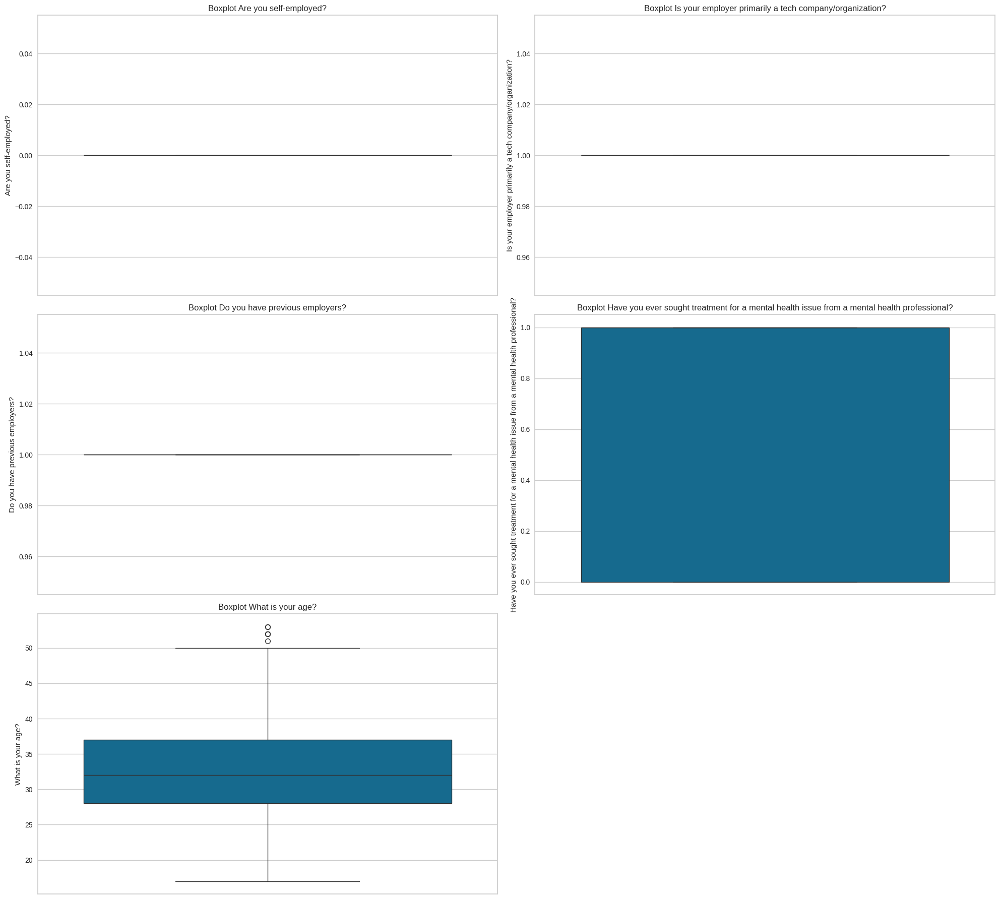

In [62]:
numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns
# Boxplot untuk fitur numerik
plt.figure(figsize=(20, 18))

for i, col in enumerate(numerical_columns, 1):
    plt.subplot(3, 2, i)
    sns.boxplot(data=df, y=col)
    plt.title(f"Boxplot {col}")

plt.tight_layout()
plt.show()

Diagram di atas merupakan boxplot yang ditampilkan setelah proses penghapusan outlier dilakukan. Meskipun demikian, masih terlihat adanya outlier pada kolom **What is your age?**. Bisa dilihat bahwa range umur nya terlogong masuk akal walaupun masih terdetect sedikit outlier pada kolom tersebut. Namun, pada tahap ini, penghapusan outlier tidak dilakukan lebih lanjut guna menjaga keberagaman (variasi) data yang ada, sehingga informasi yang terkandung dalam dataset tetap terjaga.

## 5.5 Encoding Data Kategorikal

Karena ini akan menggunakan model machine learning, jadi model ml tuh gabisa langsung memproses inputan yg kategori gitu jadi harus di encoding dulu.

In [63]:
from sklearn.preprocessing import OneHotEncoder

# Initialize one hot encoder
encoder = OneHotEncoder(drop="first", sparse_output=False)

# Categorical columns in both dataframes
categorical_cols = df.select_dtypes(include=['object']).columns


encoder = OneHotEncoder(drop="first", sparse_output=False)
encoded_cat = encoder.fit_transform(df[categorical_cols])

# Buat DataFrame dari hasil encoding dengan indeks yang sama
encoded_df = pd.DataFrame(encoded_cat, columns=encoder.get_feature_names_out(categorical_cols), index=df.index)

# Gabungkan dengan dataframe asli
df_encoded = pd.concat([df.drop(columns=categorical_cols), encoded_df], axis=1)

Label Encoding mungkin bukan pilihan terbaik, karena cara ini memberi nilai numerik pada kategori tanpa memperhatikan urutannya. Ini bisa menyebabkan masalah, terutama dengan model machine learning yang mungkin menafsirkan angka tersebut memiliki urutan atau hubungan numerik (padahal tidak ada urutan yang sebenarnya). Namun, jika kategori tidak memiliki urutan, **One-Hot Encoding** lebih cocok. One-Hot Encoding membuat kolom baru untuk setiap kategori, menghindari masalah interpretasi urutan yang tidak ada. Hal ini penting, di mana setiap kategori harus diperlakukan independen tanpa hubungan numerik antar kategori.

In [64]:
# Cek ulang dataset setelah preprocessing
df_encoded

,Are you self-employed?,Is your employer primarily a tech company/organization?,Do you have previous employers?,Have you ever sought treatment for a mental health issue from a mental health professional?,What is your age?,How many employees does your company or organization have?_100-500,How many employees does your company or organization have?_26-100,How many employees does your company or organization have?_500-1000,How many employees does your company or organization have?_6-25,How many employees does your company or organization have?_More than 1000,...,Which of the following best describes your work position?_Supervisor/Team Lead|Support|Front-end Developer|Back-end Developer,Which of the following best describes your work position?_Support,Which of the following best describes your work position?_Support|Back-end Developer,Which of the following best describes your work position?_Support|Back-end Developer|Front-end Developer,Which of the following best describes your work position?_Support|Front-end Developer|Back-end Developer,Which of the following best describes your work position?_Support|HR|Supervisor/Team Lead|Executive Leadership,Which of the following best describes your work position?_Support|Other,Which of the following best describes your work position?_Support|Sales|Designer,Do you work remotely?_Never,Do you work remotely?_Sometimes
0,0,1.0,1,0,39,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,0,1.0,1,1,29,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0,1.0,1,1,38,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0,1.0,1,1,42,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
6,0,1.0,1,0,30,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1424,0,1.0,1,1,22,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1425,0,1.0,1,0,24,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1426,0,1.0,1,1,26,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1427,0,1.0,1,1,38,0.0,0.0,1.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [65]:
df_final = df_encoded.copy()
df_final

,Are you self-employed?,Is your employer primarily a tech company/organization?,Do you have previous employers?,Have you ever sought treatment for a mental health issue from a mental health professional?,What is your age?,How many employees does your company or organization have?_100-500,How many employees does your company or organization have?_26-100,How many employees does your company or organization have?_500-1000,How many employees does your company or organization have?_6-25,How many employees does your company or organization have?_More than 1000,...,Which of the following best describes your work position?_Supervisor/Team Lead|Support|Front-end Developer|Back-end Developer,Which of the following best describes your work position?_Support,Which of the following best describes your work position?_Support|Back-end Developer,Which of the following best describes your work position?_Support|Back-end Developer|Front-end Developer,Which of the following best describes your work position?_Support|Front-end Developer|Back-end Developer,Which of the following best describes your work position?_Support|HR|Supervisor/Team Lead|Executive Leadership,Which of the following best describes your work position?_Support|Other,Which of the following best describes your work position?_Support|Sales|Designer,Do you work remotely?_Never,Do you work remotely?_Sometimes
0,0,1.0,1,0,39,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,0,1.0,1,1,29,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0,1.0,1,1,38,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0,1.0,1,1,42,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
6,0,1.0,1,0,30,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1424,0,1.0,1,1,22,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1425,0,1.0,1,0,24,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1426,0,1.0,1,1,26,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1427,0,1.0,1,1,38,0.0,0.0,1.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# **6. Pembangunan Model Clustering**

## **6.1. Pembangunan Model Clustering**

Pada tahap ini, membangun model clustering dengan memilih algoritma yang sesuai untuk mengelompokkan data berdasarkan kesamaan.
1. Pilih algoritma clustering yang sesuai.
2. Latih model dengan data menggunakan algoritma tersebut.

In [66]:
categorical_cols

Index(['How many employees does your company or organization have?',
       'Does your employer provide mental health benefits as part of healthcare coverage?',
       'Do you know the options for mental health care available under your employer-provided coverage?',
       'Has your employer ever formally discussed mental health (for example, as part of a wellness campaign or other official communication)?',
       'Does your employer offer resources to learn more about mental health concerns and options for seeking help?',
       'Is your anonymity protected if you choose to take advantage of mental health or substance abuse treatment resources provided by your employer?',
       'If a mental health issue prompted you to request a medical leave from work, asking for that leave would be:',
       'Do you think that discussing a mental health disorder with your employer would have negative consequences?',
       'Do you think that discussing a physical health issue with your employer wo

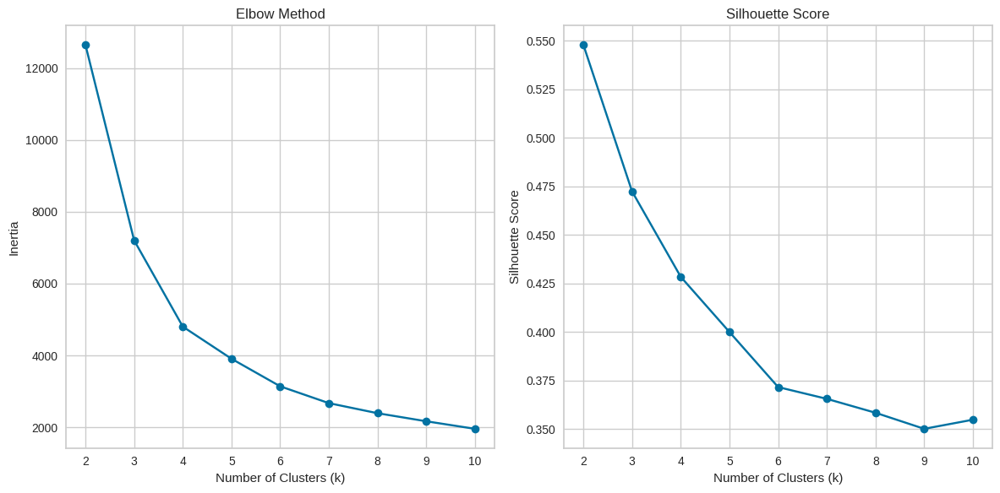

Optimal number of clusters (based on Silhouette Score): 2


In [67]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

# Apply PCA to reduce dimensionality before clustering
pca = PCA(n_components=2)  # Reduce to 2 dimensions for visualization
X_pca = pca.fit_transform(df_final)

# Elbow Method to find optimal number of clusters
inertia = []
sil_scores = []
k_range = range(2, 11)  # Test from 2 to 10 clusters
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_pca)  # Fit on PCA-reduced data
    inertia.append(kmeans.inertia_)
    sil_scores.append(silhouette_score(X_pca, kmeans.labels_))

# Plot Elbow Method
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(k_range, inertia, marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')

# Plot Silhouette Score
plt.subplot(1, 2, 2)
plt.plot(k_range, sil_scores, marker='o')
plt.title('Silhouette Score')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.tight_layout()
plt.show()

# Find the optimal number of clusters based on the Elbow Method and Silhouette Score
optimal_k = k_range[sil_scores.index(max(sil_scores))]  # Highest Silhouette Score
print(f"Optimal number of clusters (based on Silhouette Score): {optimal_k}")


In [68]:
from sklearn.cluster import KMeans

# Inisialisasi dan melatih model KMeans dengan jumlah cluster = 2
kmeans = KMeans(n_clusters=2, random_state=0)
kmeans.fit(df_final)

# Mendapatkan label cluster
labels = kmeans.labels_

## **6.2. Evaluasi Model Clustering**

Untuk menentukan jumlah cluster yang optimal dalam model clustering, Anda dapat menggunakan metode Elbow atau Silhouette Score.

Metode ini membantu kita menemukan jumlah cluster yang memberikan pemisahan terbaik antar kelompok data, sehingga model yang dibangun dapat lebih efektif. Berikut adalah **rekomendasi** tahapannya.
1. Gunakan Silhouette Score dan Elbow Method untuk menentukan jumlah cluster optimal.
2. Hitung Silhouette Score sebagai ukuran kualitas cluster.

In [69]:
from sklearn.metrics import silhouette_score

score = silhouette_score(df_final, labels)
print("Silhouette Score:", score)

Silhouette Score: 0.35897683257667357


Sebelum melakukan pelatihan model, terlebih dahulu ditentukan jumlah klaster optimal menggunakan metode Elbow. Berdasarkan grafik yang ditampilkan, terlihat bahwa titik siku (elbow point) berada pada jumlah klaster 2, sehingga jumlah tersebut dipilih sebagai jumlah klaster yang optimal untuk proses clustering.

## **6.3. Visualisasi Hasil Clustering**

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(


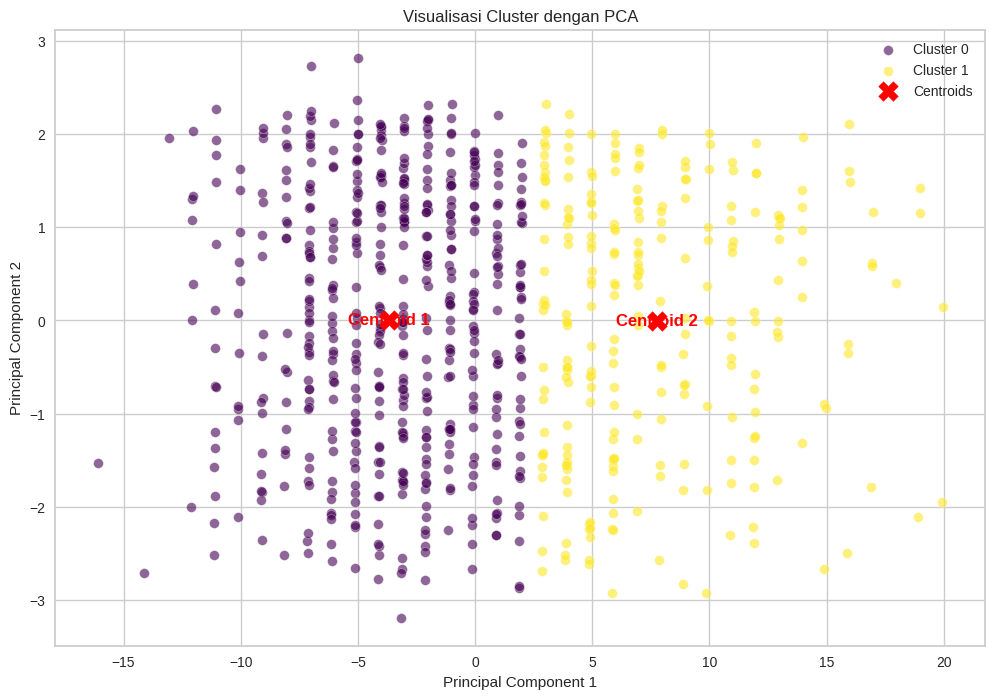

In [70]:

import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans


# Inisialisasi dan latih model KMeans (jumlah cluster disesuaikan)
kmeans = KMeans(n_clusters=2, random_state=0)
cluster_labels = kmeans.fit_predict(df_final)

# Proyeksikan centroid ke ruang PCA
centroids_pca = pca.transform(kmeans.cluster_centers_)

# Warna untuk setiap cluster
unique_labels = np.unique(cluster_labels)
colors = plt.cm.viridis(np.linspace(0, 1, len(unique_labels)))

plt.figure(figsize=(12, 8))

# Plot setiap cluster
for label, color in zip(unique_labels, colors):
    plt.scatter(X_pca[cluster_labels == label, 0], X_pca[cluster_labels == label, 1],
                color=color, label=f'Cluster {label}', alpha=0.6, edgecolors='w', s=50)

# Plot centroid
plt.scatter(centroids_pca[:, 0], centroids_pca[:, 1], c='red', s=200, marker="X", label='Centroids')

# Tambahkan label centroid
for i, centroid in enumerate(centroids_pca):
    plt.text(centroid[0], centroid[1], f'Centroid {i+1}', color='red', fontsize=12, ha='center', va='center', fontweight='bold')

# Tambahkan label dan grid
plt.title('Visualisasi Cluster dengan PCA')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.grid(True)

plt.show()



Setelah model clustering dilatih dan jumlah cluster optimal ditentukan, langkah selanjutnya adalah menampilkan hasil clustering melalui visualisasi.

Berikut adalah **rekomendasi** tahapannya.
1. Tampilkan hasil clustering dalam bentuk visualisasi, seperti grafik scatter plot atau 2D PCA projection.

In [71]:
df_final = df_encoded.copy()
df_final

,Are you self-employed?,Is your employer primarily a tech company/organization?,Do you have previous employers?,Have you ever sought treatment for a mental health issue from a mental health professional?,What is your age?,How many employees does your company or organization have?_100-500,How many employees does your company or organization have?_26-100,How many employees does your company or organization have?_500-1000,How many employees does your company or organization have?_6-25,How many employees does your company or organization have?_More than 1000,...,Which of the following best describes your work position?_Supervisor/Team Lead|Support|Front-end Developer|Back-end Developer,Which of the following best describes your work position?_Support,Which of the following best describes your work position?_Support|Back-end Developer,Which of the following best describes your work position?_Support|Back-end Developer|Front-end Developer,Which of the following best describes your work position?_Support|Front-end Developer|Back-end Developer,Which of the following best describes your work position?_Support|HR|Supervisor/Team Lead|Executive Leadership,Which of the following best describes your work position?_Support|Other,Which of the following best describes your work position?_Support|Sales|Designer,Do you work remotely?_Never,Do you work remotely?_Sometimes
0,0,1.0,1,0,39,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,0,1.0,1,1,29,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0,1.0,1,1,38,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0,1.0,1,1,42,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
6,0,1.0,1,0,30,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1424,0,1.0,1,1,22,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1425,0,1.0,1,0,24,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1426,0,1.0,1,1,26,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1427,0,1.0,1,1,38,0.0,0.0,1.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [72]:
# Menampilkan komponen PCA (penjelasan kontribusi masing-masing fitur)
print("Komponen PCA (kontribusi masing-masing fitur):")
print(pca.components_)


# Melihat proporsi variansi yang dijelaskan oleh masing-masing komponen PCA
print("Variansi yang dijelaskan oleh setiap komponen PCA:")
print(pca.explained_variance_ratio_)

Komponen PCA (kontribusi masing-masing fitur):
[[ 4.38710658e-27 -3.13254484e-27 -2.03016232e-28 ...  2.09387964e-04
  -8.31576825e-03  3.48485019e-03]
 [ 1.73800391e-16 -3.38685571e-18  2.13211886e-18 ...  3.48806321e-04
  -1.86192720e-02  1.88840481e-02]]
Variansi yang dijelaskan oleh setiap komponen PCA:
[0.65821289 0.02985895]


## **e. Analisis dan Interpretasi Hasil Cluster**

**Interpretasi Target**

**Inversi Data One-Hot Encoding**

In [73]:
df_final

,Are you self-employed?,Is your employer primarily a tech company/organization?,Do you have previous employers?,Have you ever sought treatment for a mental health issue from a mental health professional?,What is your age?,How many employees does your company or organization have?_100-500,How many employees does your company or organization have?_26-100,How many employees does your company or organization have?_500-1000,How many employees does your company or organization have?_6-25,How many employees does your company or organization have?_More than 1000,...,Which of the following best describes your work position?_Supervisor/Team Lead|Support|Front-end Developer|Back-end Developer,Which of the following best describes your work position?_Support,Which of the following best describes your work position?_Support|Back-end Developer,Which of the following best describes your work position?_Support|Back-end Developer|Front-end Developer,Which of the following best describes your work position?_Support|Front-end Developer|Back-end Developer,Which of the following best describes your work position?_Support|HR|Supervisor/Team Lead|Executive Leadership,Which of the following best describes your work position?_Support|Other,Which of the following best describes your work position?_Support|Sales|Designer,Do you work remotely?_Never,Do you work remotely?_Sometimes
0,0,1.0,1,0,39,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,0,1.0,1,1,29,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0,1.0,1,1,38,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0,1.0,1,1,42,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
6,0,1.0,1,0,30,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1424,0,1.0,1,1,22,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1425,0,1.0,1,0,24,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1426,0,1.0,1,1,26,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1427,0,1.0,1,1,38,0.0,0.0,1.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [74]:
categorical_cols

Index(['How many employees does your company or organization have?',
       'Does your employer provide mental health benefits as part of healthcare coverage?',
       'Do you know the options for mental health care available under your employer-provided coverage?',
       'Has your employer ever formally discussed mental health (for example, as part of a wellness campaign or other official communication)?',
       'Does your employer offer resources to learn more about mental health concerns and options for seeking help?',
       'Is your anonymity protected if you choose to take advantage of mental health or substance abuse treatment resources provided by your employer?',
       'If a mental health issue prompted you to request a medical leave from work, asking for that leave would be:',
       'Do you think that discussing a mental health disorder with your employer would have negative consequences?',
       'Do you think that discussing a physical health issue with your employer wo

**Inverse Transform**

In [75]:
# 1. Ambil nama-nama kolom yang dihasilkan setelah encoding
encoded_cols = encoder.get_feature_names_out(categorical_cols)

# 2. Pilih hanya fitur kategorikal yang telah diencoding
encoded_data = df_final[encoded_cols]

# 3. Lakukan inverse_transform pada data yang telah diencoding
X_original = encoder.inverse_transform(encoded_data)

# 4. Convert hasil inverse_transform menjadi DataFrame
X_original_df = pd.DataFrame(X_original, columns=categorical_cols, index=df_final.index)

# 5. Gabungkan kembali kolom 'Cluster' dengan data yang telah diinversi
X_original_df['Cluster'] = labels

# 6. Tampilkan hasilnya
print(X_original_df.head())

# 8. Cek shape dari data encoded
print(f"Encoded data shape: {encoded_data.shape}")


  How many employees does your company or organization have?  \
0                                             26-100           
1                                               6-25           
2                                               6-25           
5                                     More than 1000           
6                                             26-100           

  Does your employer provide mental health benefits as part of healthcare coverage?  \
0                    Not eligible for coverage / N/A                                  
1                                                 No                                  
2                                                 No                                  
5                                                Yes                                  
6                                       I don't know                                  

  Do you know the options for mental health care available under your employer-provided cove

Karena yang saya lakukan encoding dan tidak melakukan binning dikarenakan concern terhadap data dikhawatirkan mengurangi pola atau informasi penting yang terkandung dalam dataset.

Sudah berhasil mengembalikan kolom yang diencode, kolomnya sudah berhasil **Inversi data ke versi asli**

Sudah berhasil mengcluster di tiap kolom

In [83]:
X_original_df.keys()

Index(['How many employees does your company or organization have?',
       'Does your employer provide mental health benefits as part of healthcare coverage?',
       'Do you know the options for mental health care available under your employer-provided coverage?',
       'Has your employer ever formally discussed mental health (for example, as part of a wellness campaign or other official communication)?',
       'Does your employer offer resources to learn more about mental health concerns and options for seeking help?',
       'Is your anonymity protected if you choose to take advantage of mental health or substance abuse treatment resources provided by your employer?',
       'If a mental health issue prompted you to request a medical leave from work, asking for that leave would be:',
       'Do you think that discussing a mental health disorder with your employer would have negative consequences?',
       'Do you think that discussing a physical health issue with your employer wo

In [77]:
import pandas as pd

# Misalkan 'df_final' adalah DataFrame yang berisi data kategorikal dan numerik yang sudah di-encode
# 'X_original_df' adalah DataFrame yang berisi hasil inverse transform dari kolom kategorikal

# Hapus kolom-kolom kategorikal yang sudah di-encode dari df_final
df_without_categorical = df_final.drop(columns=encoded_cols)

# Gabungkan DataFrame hasil inverse transform dengan df_without_categorical
df_combined = pd.concat([df_without_categorical, X_original_df], axis=1)

# Menampilkan DataFrame yang sudah digabungkan
print(df_combined.head())


   Are you self-employed?  \
0                       0   
1                       0   
2                       0   
5                       0   
6                       0   

   Is your employer primarily a tech company/organization?  \
0                                                1.0         
1                                                1.0         
2                                                1.0         
5                                                1.0         
6                                                1.0         

   Do you have previous employers?  \
0                                1   
1                                1   
2                                1   
5                                1   
6                                1   

   Have you ever sought treatment for a mental health issue from a mental health professional?  \
0                                                  0                                             
1                          

In [79]:
df_combined

,Are you self-employed?,Is your employer primarily a tech company/organization?,Do you have previous employers?,Have you ever sought treatment for a mental health issue from a mental health professional?,What is your age?,How many employees does your company or organization have?,Does your employer provide mental health benefits as part of healthcare coverage?,Do you know the options for mental health care available under your employer-provided coverage?,"Has your employer ever formally discussed mental health (for example, as part of a wellness campaign or other official communication)?",Does your employer offer resources to learn more about mental health concerns and options for seeking help?,...,"If you have a mental health issue, do you feel that it interferes with your work when being treated effectively?","If you have a mental health issue, do you feel that it interferes with your work when NOT being treated effectively?",What is your gender?,What country do you live in?,What US state or territory do you live in?,What country do you work in?,What US state or territory do you work in?,Which of the following best describes your work position?,Do you work remotely?,Cluster
0,0,1.0,1,0,39,26-100,Not eligible for coverage / N/A,Unknown,No,No,...,Not applicable to me,Not applicable to me,Male,United Kingdom,Unknown,United Kingdom,Unknown,Back-end Developer,Sometimes,1
1,0,1.0,1,1,29,6-25,No,Yes,Yes,Yes,...,Rarely,Sometimes,male,United States of America,Illinois,United States of America,Illinois,Back-end Developer|Front-end Developer,Never,0
2,0,1.0,1,1,38,6-25,No,Unknown,No,No,...,Not applicable to me,Not applicable to me,Male,United Kingdom,Unknown,United Kingdom,Unknown,Back-end Developer,Always,1
5,0,1.0,1,1,42,More than 1000,Yes,I am not sure,No,Yes,...,Not applicable to me,Often,Male,United Kingdom,Unknown,United Kingdom,Unknown,DevOps/SysAdmin|Support|Back-end Developer|Fro...,Sometimes,1
6,0,1.0,1,0,30,26-100,I don't know,No,No,No,...,Not applicable to me,Not applicable to me,M,United States of America,Tennessee,United States of America,Tennessee,Back-end Developer,Sometimes,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1424,0,1.0,1,1,22,100-500,Not eligible for coverage / N/A,Unknown,No,No,...,Rarely,Often,female,Canada,Unknown,Canada,Unknown,Back-end Developer|Front-end Developer,Sometimes,0
1425,0,1.0,1,0,24,100-500,Yes,I am not sure,Yes,Yes,...,Rarely,Rarely,Male,Canada,Unknown,Canada,Unknown,Supervisor/Team Lead|Front-end Developer|Back-...,Sometimes,0
1426,0,1.0,1,1,26,100-500,I don't know,I am not sure,No,I don't know,...,Rarely,Often,Female,Canada,Unknown,Canada,Unknown,Other,Sometimes,0
1427,0,1.0,1,1,38,500-1000,Yes,No,No,No,...,Rarely,Often,female,United States of America,Illinois,United States of America,Illinois,Support,Always,1


Sudah berhasil mengembalikan kolom yang diencode, kolomnya sudah berhasil **Inversi data ke versi asli**

Sudah berhasil **mengcluster di tiap kolom**

In [80]:
# Mengidentifikasi kolom numerik dan kategorikal
numeric_columns = df_combined.select_dtypes(include=['number']).columns
categorical_columns = df_combined.select_dtypes(include=['object']).columns

# Melakukan agregasi untuk kolom numerik (mean, min, max)
numeric_aggregated = df_combined[numeric_columns].groupby('Cluster').agg(['mean', 'min', 'max'])

# Melakukan agregasi untuk kolom kategorikal (modus)
categorical_aggregated = df_combined.groupby('Cluster')[categorical_columns].agg(lambda x: x.mode()[0])

# Menggabungkan hasil agregasi numerik dan kategorikal
aggregated = pd.concat([numeric_aggregated, categorical_aggregated], axis=1)

# Menampilkan hasil agregasi
print(aggregated)

         (Are you self-employed?, mean)  (Are you self-employed?, min)  \
Cluster                                                                  
0                                   0.0                              0   
1                                   0.0                              0   

         (Are you self-employed?, max)  \
Cluster                                  
0                                    0   
1                                    0   

         (Is your employer primarily a tech company/organization?, mean)  \
Cluster                                                                    
0                                                      1.0                 
1                                                      1.0                 

         (Is your employer primarily a tech company/organization?, min)  \
Cluster                                                                   
0                                                      1.0                
1   

Sudah berhasil **mengaggregate data** yang sudah diinversi data ke versi asli

# Analisis Berdasarkan Hasil Clustering

Berdasarkan hasil clustering pada data, ada dua cluster yang terbentuk. Setiap cluster menunjukkan pola yang berbeda dalam respons terhadap berbagai pertanyaan dalam survei. Berikut adalah analisis lebih rinci berdasarkan berbagai fitur yang ada dalam data:

---

### 1. Status Kewirausahaan: "Are you self-employed?"
   - Cluster 0 & 1: Nilai rata-rata, minimum, dan maksimum untuk pertanyaan ini menunjukkan bahwa kedua cluster tidak memiliki individu yang bekerja sebagai wiraswasta. Artinya, pada kedua cluster, semua responden bekerja untuk perusahaan atau organisasi, bukan berwirausaha.

   Kesimpulan: Kedua cluster ini terdiri dari individu yang tidak berwirausaha (semua nilai 0).

---

### 2. Perusahaan Teknologi: "Is your employer primarily a tech company/organization?"
   - Cluster 0 & 1: Nilai untuk rata-rata, minimum, dan maksimum untuk kedua cluster adalah 1, yang berarti bahwa semua individu dalam kedua cluster bekerja di perusahaan yang berfokus pada teknologi.

   Kesimpulan: Kedua cluster ini terdiri dari individu yang bekerja di perusahaan teknologi, baik secara individu maupun kolektif.

---

### 3. Pengalaman Kerja Sebelumnya: "Do you have previous employers?"
   - Cluster 0 & 1: Nilai rata-rata, minimum, dan maksimum untuk pertanyaan ini adalah 1, yang menunjukkan bahwa semua individu dalam kedua cluster memiliki pengalaman kerja sebelumnya.

   Kesimpulan: Setiap individu dalam kedua cluster memiliki pengalaman kerja sebelumnya, menandakan bahwa mereka bukan pekerja baru yang baru memulai karir.

---

### 4. Masalah Kesehatan Mental: "Have you ever sought treatment for a mental health issue from a mental health professional?"
   - Cluster 0: 57.5% individu dalam cluster ini pernah mencari perawatan untuk masalah kesehatan mental.
   - Cluster 1: 61.6% individu dalam cluster ini pernah mencari perawatan untuk masalah kesehatan mental.

   Kesimpulan: Kedua cluster memiliki tingkat pencarian perawatan untuk masalah kesehatan mental yang cukup tinggi, dengan sedikit perbedaan antara keduanya. Hal ini menunjukkan bahwa kesehatan mental mungkin menjadi isu yang signifikan di kalangan pekerja teknologi di kedua cluster ini.

---

### 5. Diagnosis Masalah Kesehatan Mental: "Have you been diagnosed with a mental health condition by a medical professional?"
   - Cluster 0: Mayoritas individu dalam cluster ini tidak pernah didiagnosis dengan kondisi kesehatan mental.
   - Cluster 1: Sebagian besar individu dalam cluster ini telah didiagnosis dengan kondisi kesehatan mental.

   Kesimpulan: Cluster 0 cenderung tidak memiliki diagnosis kondisi kesehatan mental, sementara cluster 1 lebih cenderung memiliki diagnosis kondisi tersebut. Ini menunjukkan bahwa individu dalam cluster 1 mungkin lebih terbuka terhadap diagnosis atau lebih sering berinteraksi dengan tenaga medis untuk masalah kesehatan mental.

---

### 6. Pengaruh Kesehatan Mental Terhadap Pekerjaan:
   - "If you have a mental health issue, do you feel that it interferes with your work when being treated effectively?": Untuk kedua cluster, jawaban adalah "Not applicable to me," yang menunjukkan bahwa responden di kedua cluster ini tidak merasa masalah kesehatan mental mereka mengganggu pekerjaan ketika diterapi secara efektif, atau mungkin mereka tidak memiliki masalah kesehatan mental yang cukup signifikan untuk memengaruhi pekerjaan mereka.
   - "If you have a mental health issue, do you feel that it interferes with your work when NOT being treated effectively?": Kedua cluster ini memberikan respons "Often," yang menunjukkan bahwa kesehatan mental yang tidak terkelola dengan baik cenderung mengganggu pekerjaan mereka.

   Kesimpulan: Kedua cluster ini cenderung mengalami gangguan pekerjaan terkait masalah kesehatan mental yang tidak ditangani dengan baik. Namun, mereka mungkin tidak merasa hal tersebut memengaruhi pekerjaan mereka saat perawatan dilakukan dengan efektif.

---

### 7. Identitas dan Lokasi:
   - Jenis Kelamin: Semua individu dalam kedua cluster adalah pria.
   - Lokasi: Semua individu tinggal dan bekerja di Amerika Serikat, meskipun negara bagian atau wilayah mereka tidak diketahui (Unknown).

   Kesimpulan: Berdasarkan jenis kelamin dan lokasi, baik cluster 0 maupun 1 terdiri dari pria yang tinggal dan bekerja di Amerika Serikat, meskipun detail spesifik tentang negara bagian mereka tidak tersedia.

---

### 8. Posisi Pekerjaan: "Which of the following best describes your work position?"
   - Cluster 0 & 1: Kedua cluster ini memiliki mayoritas pekerja yang berposisi sebagai Back-end Developer.

   Kesimpulan: Pekerjaan utama di kedua cluster adalah pengembang perangkat lunak (back-end developer), yang menunjukkan bahwa kedua cluster ini terdiri dari profesional teknologi dengan posisi serupa.

---

### 9. Pekerjaan Jarak Jauh: "Do you work remotely?"
   - Cluster 0 & 1: Kedua cluster ini memiliki pekerjaan jarak jauh dengan status "Sometimes."

   Kesimpulan: Kedua cluster ini mengalami pekerjaan jarak jauh dalam frekuensi yang sama, yaitu "Kadang-kadang." Ini menunjukkan bahwa meskipun mereka bekerja di perusahaan teknologi, pekerjaan jarak jauh tidak sepenuhnya diterapkan, tetapi dilakukan sesekali.

---

### Kesimpulan Umum:
- Cluster 0 dan Cluster 1 memiliki kesamaan yang cukup besar, dengan keduanya terdiri dari pria yang bekerja di perusahaan teknologi sebagai pengembang perangkat lunak (back-end developer), sering bekerja secara remote, dan memiliki pengalaman kerja sebelumnya.
- Perbedaan antara cluster ini lebih terkait dengan tingkat pencarian perawatan kesehatan mental dan diagnosis kondisi kesehatan mental, di mana Cluster 1 lebih banyak yang pernah didiagnosis dibandingkan dengan Cluster 0.
- Keduanya mengalami gangguan pekerjaan terkait masalah kesehatan mental, namun tidak merasakannya ketika mendapatkan perawatan yang efektif.


# **7. Mengeksport Data**

Simpan hasilnya ke dalam file CSV.

In [81]:
df_combined.head()

,Are you self-employed?,Is your employer primarily a tech company/organization?,Do you have previous employers?,Have you ever sought treatment for a mental health issue from a mental health professional?,What is your age?,How many employees does your company or organization have?,Does your employer provide mental health benefits as part of healthcare coverage?,Do you know the options for mental health care available under your employer-provided coverage?,"Has your employer ever formally discussed mental health (for example, as part of a wellness campaign or other official communication)?",Does your employer offer resources to learn more about mental health concerns and options for seeking help?,...,"If you have a mental health issue, do you feel that it interferes with your work when being treated effectively?","If you have a mental health issue, do you feel that it interferes with your work when NOT being treated effectively?",What is your gender?,What country do you live in?,What US state or territory do you live in?,What country do you work in?,What US state or territory do you work in?,Which of the following best describes your work position?,Do you work remotely?,Cluster
0,0,1.0,1,0,39,26-100,Not eligible for coverage / N/A,Unknown,No,No,...,Not applicable to me,Not applicable to me,Male,United Kingdom,Unknown,United Kingdom,Unknown,Back-end Developer,Sometimes,1
1,0,1.0,1,1,29,6-25,No,Yes,Yes,Yes,...,Rarely,Sometimes,male,United States of America,Illinois,United States of America,Illinois,Back-end Developer|Front-end Developer,Never,0
2,0,1.0,1,1,38,6-25,No,Unknown,No,No,...,Not applicable to me,Not applicable to me,Male,United Kingdom,Unknown,United Kingdom,Unknown,Back-end Developer,Always,1
5,0,1.0,1,1,42,More than 1000,Yes,I am not sure,No,Yes,...,Not applicable to me,Often,Male,United Kingdom,Unknown,United Kingdom,Unknown,DevOps/SysAdmin|Support|Back-end Developer|Fro...,Sometimes,1
6,0,1.0,1,0,30,26-100,I don't know,No,No,No,...,Not applicable to me,Not applicable to me,M,United States of America,Tennessee,United States of America,Tennessee,Back-end Developer,Sometimes,0


dapat terlihat bahwa sudah berhasil di *Cluster* dan juga sudah dikembalikan bentuk kolom asli  

In [82]:
# Simpan hasil clustering ke dalam file CSV
df_combined.to_csv("Dataset_clustering.csv", index=False)

print("Data berhasil disimpan ke dalam file 'Dataset_clustering.csv'")


Data berhasil disimpan ke dalam file 'Dataset_clustering.csv'
